In [1]:
import pandas as pd
import numpy  as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium import plugins
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import RandomForestRegressor 
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
import xgboost as xgb

In [2]:
data=pd.read_csv('./air.csv')

In [3]:
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [4]:
data['neighbourhood_group'].unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

In [5]:
print ("La taille du data est (ligne, colonne):"+ str(data.shape))
print (data.info())

La taille du data est (ligne, colonne):(48895, 16)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-

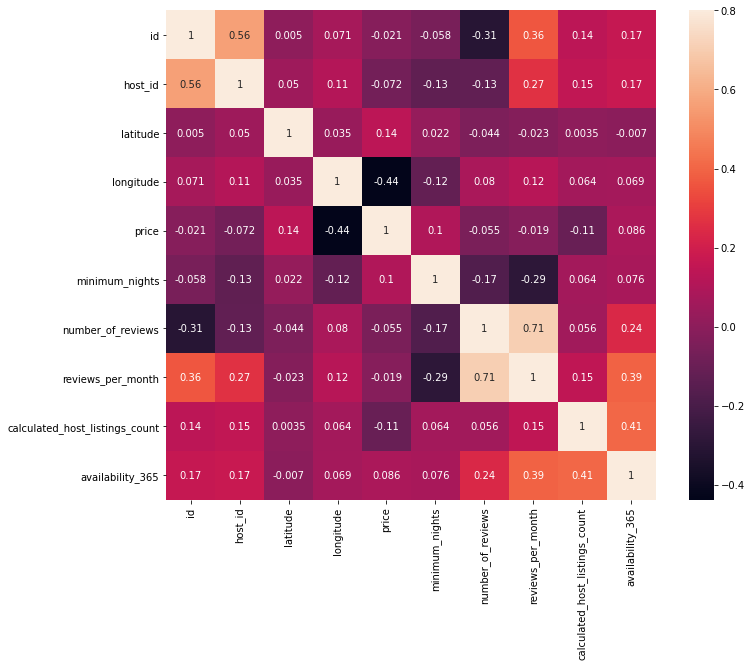

In [6]:
#Afficher la Corrélation entre les different variables  
corrmat = data.corr(method='spearman')
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True, annot=True);

# Data Viz

In [7]:
#affichage du prix par chaque position dans la map
rentPriceMap = data[["latitude", "longitude","price"]]
#ici j'ai reduit le nombre daffichage a 10000 car mon pc ramme 
rentPriceMap=rentPriceMap[:10000]
m = folium.Map([40.767937,-73.982155 ], zoom_start=10)

# affecter une marque a chaque station
for index, row in rentPriceMap.iterrows():
    #making circle for heat map {adding $ to the price}
    folium.CircleMarker([row['latitude'], row['longitude']],
                        radius=5,
                        popup=str(row['price'])+'$',
                        fill_color="#3db7e4", 
                       ).add_to(m)
    
    
rentPriceMap = rentPriceMap[['latitude', 'longitude']].to_numpy()
# affichage du heatmap
m.add_child(plugins.HeatMap(rentPriceMap, radius=25))
m


/home/mehdibalbali/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='neighbourhood_group', ylabel='price'>

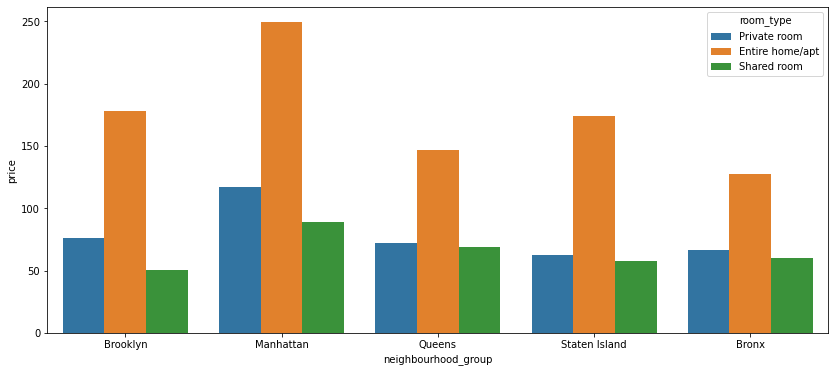

In [8]:
#print price/neighbourhood_group {room_type}
plt.figure(figsize=(14, 6))
sns.barplot(data.neighbourhood_group, data.price, hue=data.room_type, ci=None)

/home/mehdibalbali/.local/lib/python3.8/site-packages/pandas/plotting/_matplotlib/tools.py:400: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():
/home/mehdibalbali/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


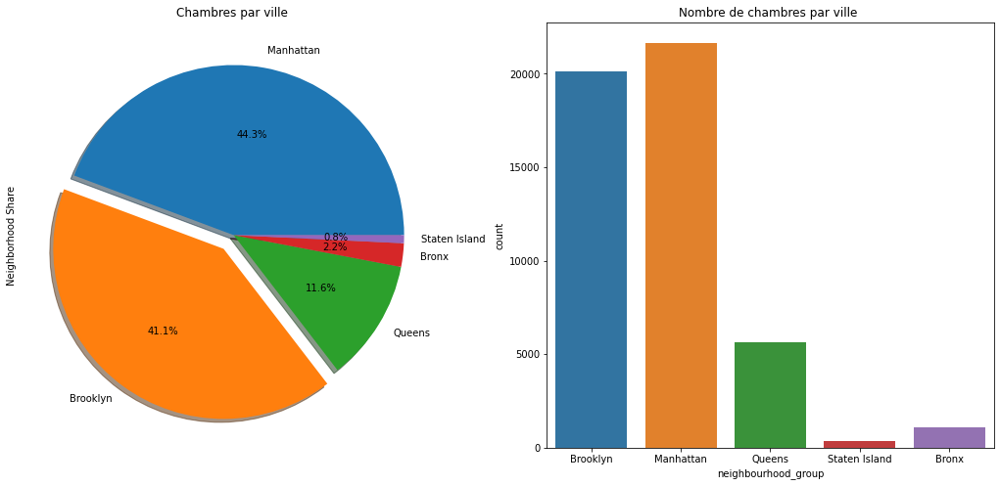

In [9]:
f, ax = plt.subplots(1,2,figsize=(18,8))
data['neighbourhood_group'].value_counts().plot.pie(explode=[0,0.1,0,0,0],autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title('Chambres par ville ')
ax[0].set_ylabel('Neighborhood Share')
sns.countplot('neighbourhood_group',data=data,ax=ax[1])
ax[1].set_title('Nombre de chambres par ville ')
plt.show()

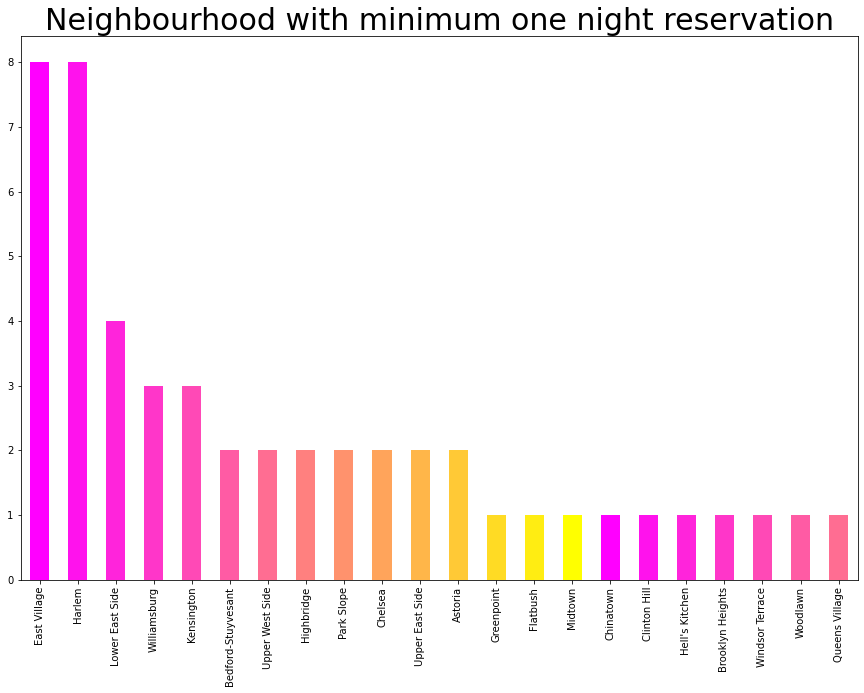

In [10]:
#plot neighbourhood with minimum one night reservation

neighbourhood=data.loc[data['minimum_nights'] == 1]
neighbourhood=neighbourhood['neighbourhood']
color = plt.cm.spring(np.linspace(0, 1, 15))
neighbourhood[:50].value_counts().plot.bar(color = color, figsize = (15, 10))

plt.title('Neighbourhood with minimum one night reservation',fontsize = 30)

plt.xticks(rotation = 90)
plt.show()

# Data cleaning

In [11]:
#verifier le nombre de valeurs null dans chaque colonne 

In [12]:
data.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [13]:
dataclean = data[["neighbourhood_group",'latitude', 'longitude',"room_type","minimum_nights","reviews_per_month","price"]]
dataclean

,neighbourhood_group,latitude,longitude,room_type,minimum_nights,reviews_per_month,price
0,Brooklyn,40.64749,-73.97237,Private room,1,0.21,149
1,Manhattan,40.75362,-73.98377,Entire home/apt,1,0.38,225
2,Manhattan,40.80902,-73.94190,Private room,3,NaN,150
3,Brooklyn,40.68514,-73.95976,Entire home/apt,1,4.64,89
4,Manhattan,40.79851,-73.94399,Entire home/apt,10,0.10,80
...,...,...,...,...,...,...,...
48890,Brooklyn,40.67853,-73.94995,Private room,2,NaN,70
48891,Brooklyn,40.70184,-73.93317,Private room,4,NaN,40
48892,Manhattan,40.81475,-73.94867,Entire home/apt,10,NaN,115
48893,Manhattan,40.75751,-73.99112,Shared room,1,NaN,55


In [14]:
#supression de tout les valeurs NAN 
dataclean=dataclean.dropna()

In [15]:
#verification 
dataclean.isnull().sum()

neighbourhood_group    0
latitude               0
longitude              0
room_type              0
minimum_nights         0
reviews_per_month      0
price                  0
dtype: int64

In [16]:
#Encodage du  neighbourhood_group et room_type
le                                 = preprocessing.LabelEncoder()
dataclean2                         = dataclean
dataclean['neighbourhood_group']   = le.fit_transform(dataclean['neighbourhood_group'])
dataclean2['room_type']            = le.fit_transform(dataclean2['room_type'])

<ipython-input-16-d08dea1b38d3>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataclean['neighbourhood_group']   = le.fit_transform(dataclean['neighbourhood_group'])
<ipython-input-16-d08dea1b38d3>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataclean2['room_type']            = le.fit_transform(dataclean2['room_type'])


In [17]:
dataclean2

,neighbourhood_group,latitude,longitude,room_type,minimum_nights,reviews_per_month,price
0,1,40.64749,-73.97237,1,1,0.21,149
1,2,40.75362,-73.98377,0,1,0.38,225
3,1,40.68514,-73.95976,0,1,4.64,89
4,2,40.79851,-73.94399,0,10,0.10,80
5,2,40.74767,-73.97500,0,3,0.59,200
...,...,...,...,...,...,...,...
48782,2,40.78099,-73.95366,1,1,1.00,129
48790,3,40.75104,-73.81459,1,1,1.00,45
48799,4,40.54179,-74.14275,1,1,1.00,235
48805,0,40.80787,-73.92400,0,1,2.00,100


# Model Tunning

In [18]:
Q1 = dataclean2.quantile(0.25)
Q3 = dataclean2.quantile(0.75)
IQR = Q3 - Q1
IQR_df = dataclean2[~((dataclean2 < (Q1 - 1.5 * IQR)) |(dataclean2 > (Q3 + 1.5 * IQR))).any(axis=1)]
Y = IQR_df['price']
X = IQR_df[["neighbourhood_group",'latitude', 'longitude',"room_type","minimum_nights","reviews_per_month"]]
X = preprocessing.normalize(X)
X = np.hstack((np.ones( (len(IQR_df['price']) ,1)), X))


X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2)


In [19]:
#regression linéere 
lr = LinearRegression()
lr.fit(X_train, Y_train)
lr_pred = lr.predict(X_test)

print('R2 :' + str(r2_score(Y_test, lr_pred)))
print('MAE: ' + str((mean_absolute_error(Y_test, lr_pred))))
print('MSE: ' + str(mean_squared_error(Y_test, lr_pred)))
print('RMSE: ' + str(np.sqrt(mean_squared_error(Y_test, lr_pred))))

R2 :0.41104117127075246
MAE: 38.131287977466
MSE: 2491.15255587862
RMSE: 49.911447142700844


In [20]:
#Random Forest Regressor
rf = RandomForestRegressor(n_estimators = 100, random_state = 42) 
rf.fit(X_train, Y_train)
rf_pred = rf.predict(X_test)
print('Score : ' + str(rf.score(X_train, Y_train)))

Score : 0.9289503032001282


In [21]:
#XGB Regressor
XGB = xgb.XGBRegressor()
XGB.fit(X_train, Y_train)
y_pred1 = XGB.predict(X_test)
print('Score : ' + str(XGB.score(X_test,Y_test)))

Score : 0.5054091681998781


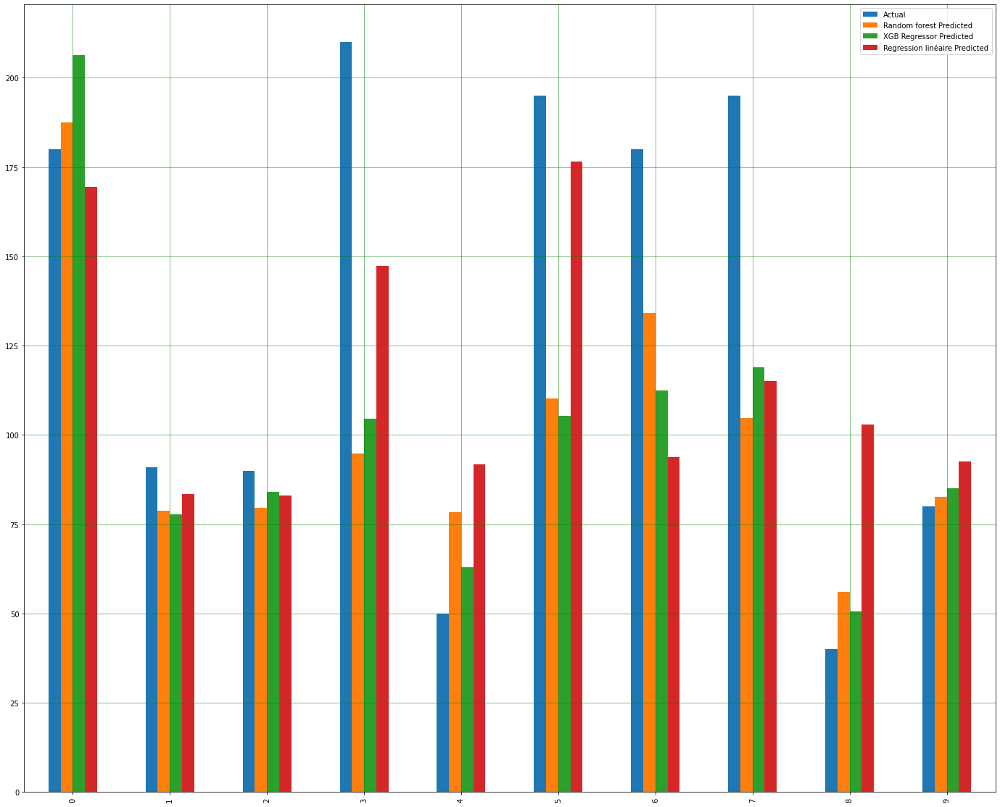

In [22]:
error_frame = pd.DataFrame({'Actual': np.array(Y_test).flatten(), 'Random forest Predicted': rf_pred.flatten(),
                           'XGB Regressor Predicted': y_pred1.flatten(),'Regression linéaire Predicted': lr_pred.flatten()})
df1 = error_frame[:10]
df1.plot(kind='bar',figsize=(24,20))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()